In [1]:
from glob import glob
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np

from sklearn.model_selection import train_test_split
import tensorflow
from tensorflow import keras
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D
from keras.layers import BatchNormalization, Dropout
from keras.applications import VGG16, VGG19
from keras.optimizers import Adam
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping, TensorBoard

ImportError: DLL load failed while importing _imaging: 지정된 모듈을 찾을 수 없습니다.

In [4]:
file_list = glob('./train/*.jpg')

In [8]:
x = plt.imread(file_list[0])

In [14]:
for file in file_list[:5]:
    print(plt.imread(file).shape)

(374, 500, 3)
(280, 300, 3)
(499, 489, 3)
(499, 403, 3)
(149, 150, 3)


(150, 150, 3)


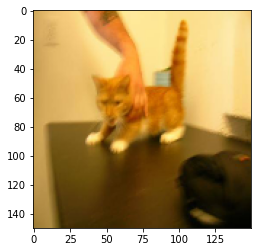

In [15]:
x = cv.resize(plt.imread(file_list[0]),(150,150))
plt.imshow(x)
print(x.shape)

In [21]:
X = np.zeros((4000,150,150,3))

In [22]:
y = []
for idx,file in enumerate(file_list):
    x = plt.imread(file)
    x = cv.resize(x,(150,150))
    X[idx] = x
    if 'cat' in file:
        y.append(0)
    else:
        y.append(1)

In [37]:
y = np.array(y)

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X,y)

In [39]:
input_shape = X_train.shape[1:]

In [43]:
model = Sequential(
    [
        Conv2D(50,(5,5),activation='relu',input_shape=input_shape),
        MaxPooling2D((3,3)),
        BatchNormalization(),
        Conv2D(150,(3,3),activation='relu'),
        MaxPooling2D((2,2)),
        Flatten(),
        Dense(128,activation='relu'),
        Dense(1,activation='sigmoid')
    ]
)

In [44]:
opt = Adam(1e-5)
loss = 'binary_crossentropy'
metrics = ['accuracy']
model.compile(optimizer=opt,
             loss=loss,
             metrics = metrics
             )

In [46]:
dog_cat_callbacks = [
    EarlyStopping(patience=7),
    TensorBoard(log_dir='./dog_cat_logs')
]

model.fit(X_train,
         y_train,
         epochs=15,
         batch_size=100,
         validation_data=(X_test,y_test),
         callbacks=dog_cat_callbacks)

Epoch 1/15
30/30 [==============================] - 71s 2s/step - loss: 0.3866 - accuracy: 0.8497 - val_loss: 0.5650 - val_accuracy: 0.7060
Epoch 2/15
30/30 [==============================] - 73s 2s/step - loss: 0.3513 - accuracy: 0.8823 - val_loss: 0.5607 - val_accuracy: 0.7020
Epoch 3/15
30/30 [==============================] - 73s 2s/step - loss: 0.3178 - accuracy: 0.9063 - val_loss: 0.5901 - val_accuracy: 0.6960
Epoch 4/15
30/30 [==============================] - 72s 2s/step - loss: 0.2947 - accuracy: 0.9177 - val_loss: 0.5758 - val_accuracy: 0.6980
Epoch 5/15
30/30 [==============================] - 74s 2s/step - loss: 0.2648 - accuracy: 0.9373 - val_loss: 0.5491 - val_accuracy: 0.7170
Epoch 6/15
30/30 [==============================] - 75s 2s/step - loss: 0.2401 - accuracy: 0.9473 - val_loss: 0.5453 - val_accuracy: 0.7150
Epoch 7/15
30/30 [==============================] - 73s 2s/step - loss: 0.2218 - accuracy: 0.9617 - val_loss: 0.5532 - val_accuracy: 0.7260
Epoch 8/15
30/30 [==

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\kangw\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3418, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-46-103a55cb7f75>", line 6, in <module>
    model.fit(X_train,
  File "C:\Users\kangw\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
    return fn(*args, **kwargs)
  File "C:\Users\kangw\anaconda3\lib\site-packages\keras\engine\training.py", line 1409, in fit
    tmp_logs = self.train_function(iterator)
  File "C:\Users\kangw\anaconda3\lib\site-packages\tensorflow\python\util\traceback_utils.py", line 150, in error_handler
    return fn(*args, **kwargs)
  File "C:\Users\kangw\anaconda3\lib\site-packages\tensorflow\python\eager\def_function.py", line 915, in __call__
    result = self._call(*args, **kwds)
  File "C:\Users\kangw\anaconda3\lib\site-packages\tensorflow\python\eager\def_function.py", line 947, in _call
    return self.

TypeError: object of type 'NoneType' has no len()

In [47]:
model.evaluate(X_train,y_train)

94/94 [==============================] - 19s 195ms/step - loss: 0.1892 - accuracy: 0.9763


[0.18920893967151642, 0.9763333201408386]

In [48]:
model.evaluate(X_test,y_test)

32/32 [==============================] - 5s 170ms/step - loss: 0.5359 - accuracy: 0.7240


[0.5358657240867615, 0.7239999771118164]

In [50]:
inds = np.random.choice(np.arange(100),100,replace=False)

1/1 [==============================] - 0s 36ms/step


<ipython-input-54-a564679ad8b7>:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  plt.imshow(X_train[ind].astype(np.int))


예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 92


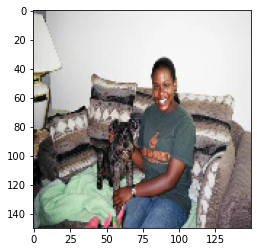

1/1 [==============================] - 0s 31ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 56


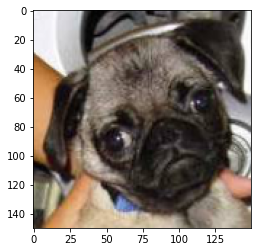

1/1 [==============================] - 0s 32ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 8


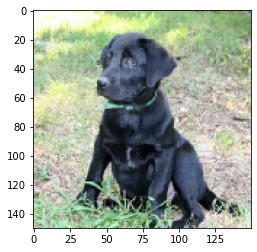

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 89


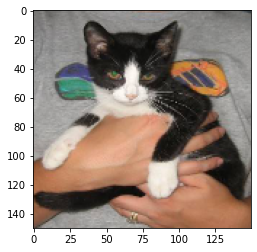

1/1 [==============================] - 0s 37ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 37


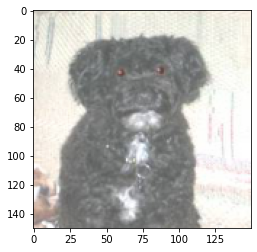

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 6


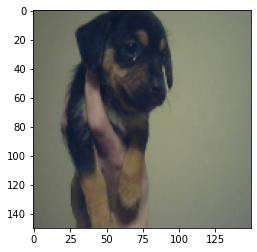

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 12


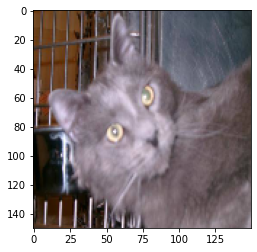

1/1 [==============================] - 0s 31ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 35


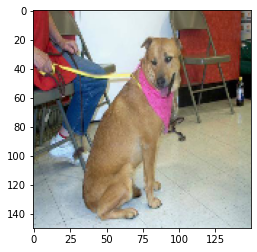

1/1 [==============================] - 0s 36ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 79


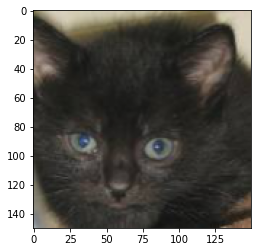

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 80


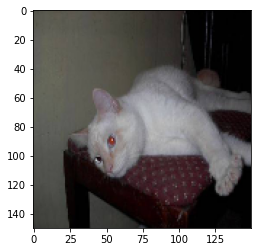

1/1 [==============================] - 0s 34ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 26


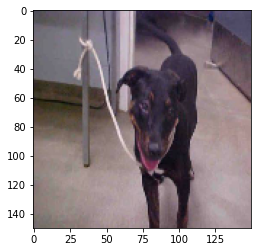

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 59


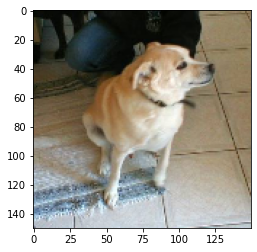

1/1 [==============================] - 0s 29ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 32


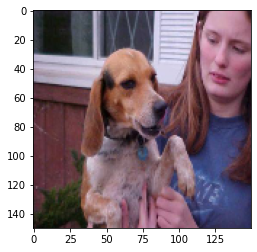

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 57


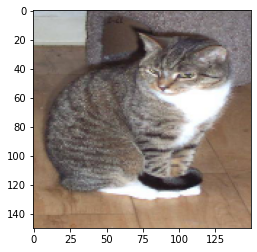

1/1 [==============================] - 0s 30ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 30


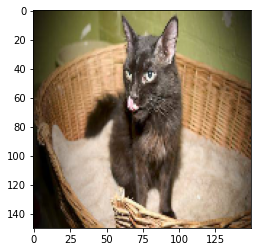

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 99


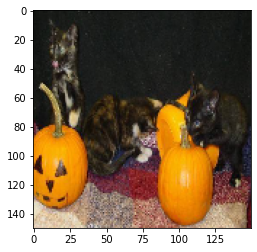

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 47


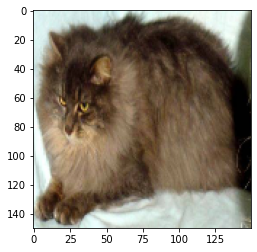

1/1 [==============================] - 0s 34ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 19


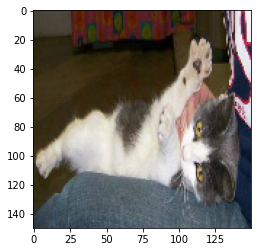

1/1 [==============================] - 0s 34ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 15


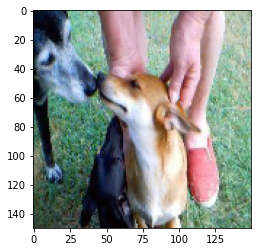

1/1 [==============================] - 0s 36ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 40


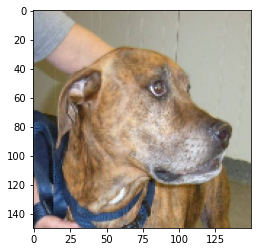

1/1 [==============================] - 0s 44ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 78


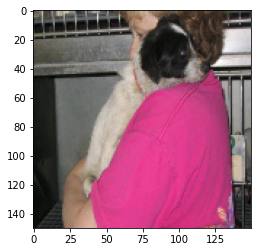

1/1 [==============================] - 0s 44ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 7


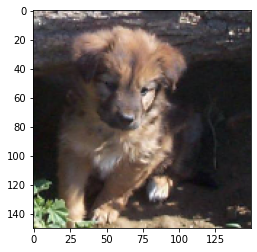

1/1 [==============================] - 0s 34ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 4


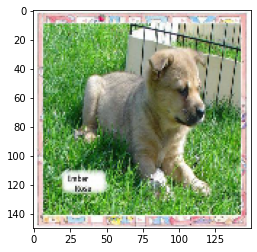

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 43


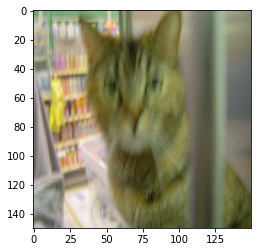

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 11


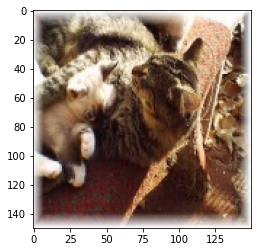

1/1 [==============================] - 0s 36ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 14


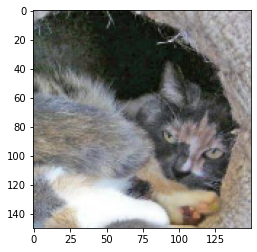

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 45


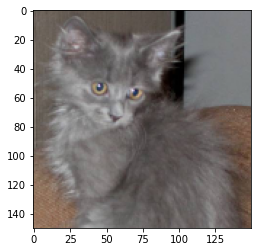

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 16


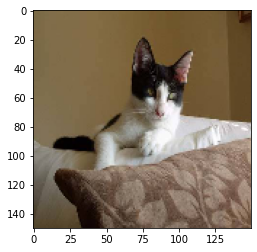

1/1 [==============================] - 0s 45ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 62


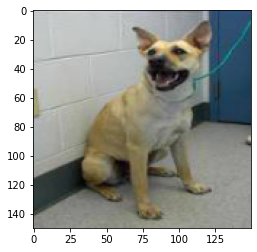

1/1 [==============================] - 0s 37ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 95


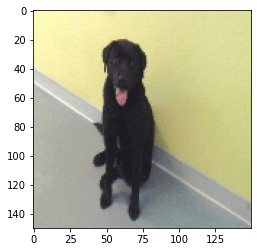

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 34


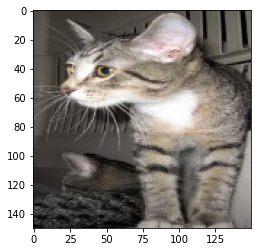

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 52


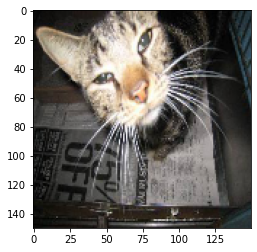

1/1 [==============================] - 0s 32ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 23


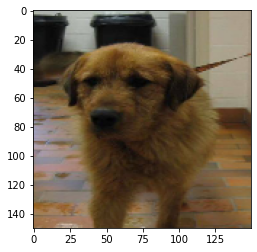

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 17


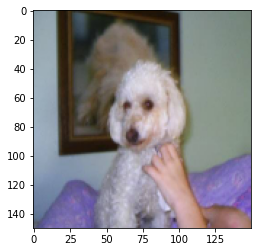

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 48


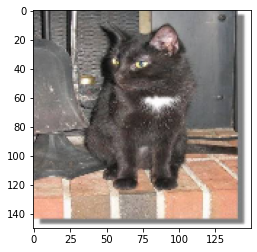

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 29


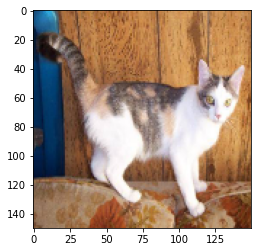

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 42


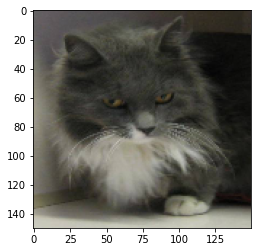

1/1 [==============================] - 0s 34ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 20


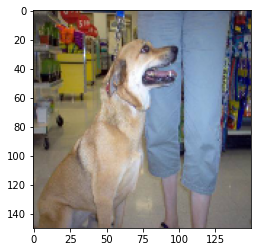

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 2


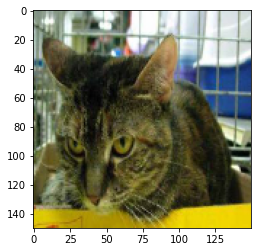

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 28


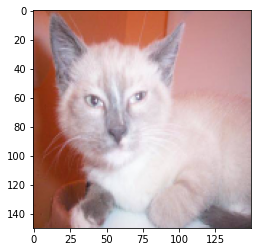

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 25


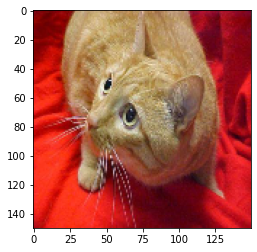

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 67


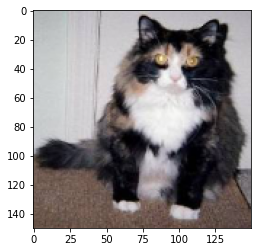

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 81


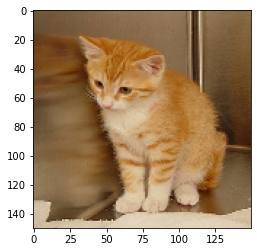

1/1 [==============================] - 0s 30ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 60


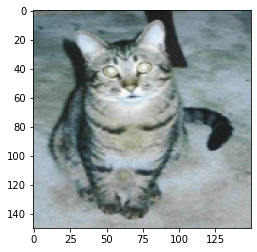

1/1 [==============================] - 0s 34ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 82


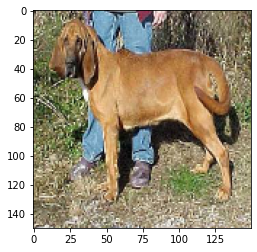

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 93


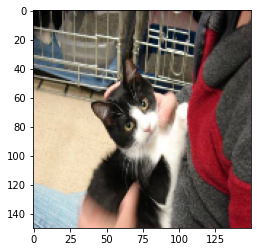

1/1 [==============================] - 0s 42ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 36


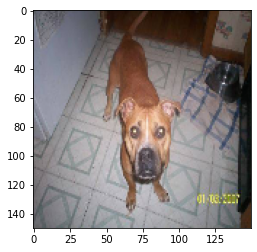

1/1 [==============================] - 0s 31ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 0


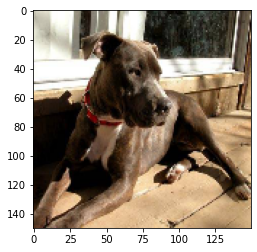

1/1 [==============================] - 0s 34ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 87


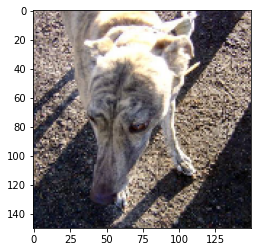

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 77


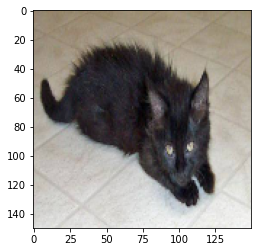

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 5


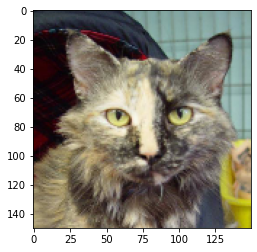

1/1 [==============================] - 0s 29ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 94


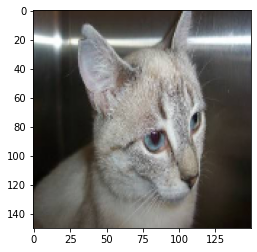

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 63


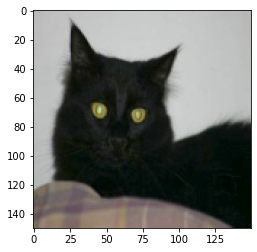

1/1 [==============================] - 0s 29ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 44


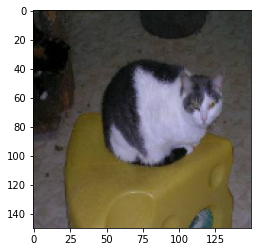

1/1 [==============================] - 0s 34ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 65


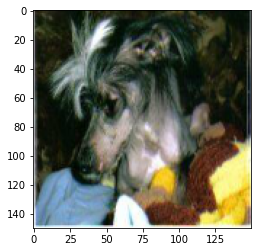

1/1 [==============================] - 0s 41ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 72


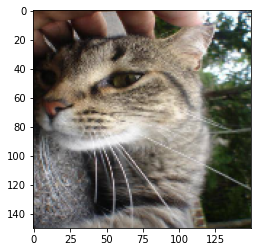

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 88


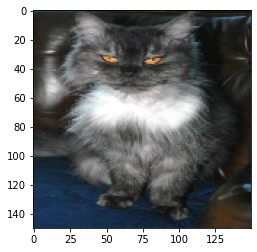

1/1 [==============================] - 0s 40ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 64


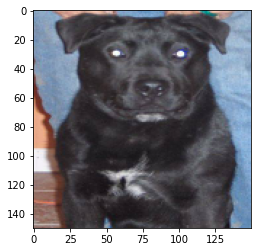

1/1 [==============================] - 0s 33ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 75


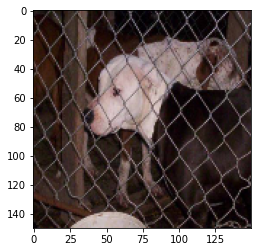

1/1 [==============================] - 0s 30ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 22


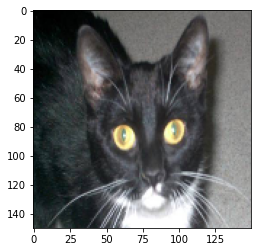

1/1 [==============================] - 0s 30ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 9


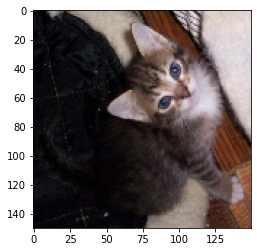

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 86


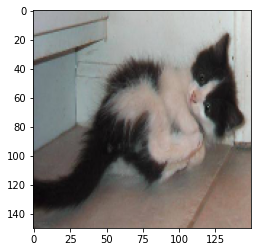

1/1 [==============================] - 0s 31ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 39


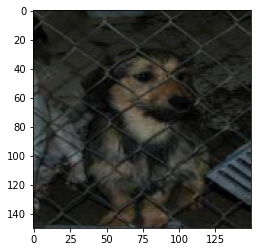

1/1 [==============================] - 0s 39ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 18


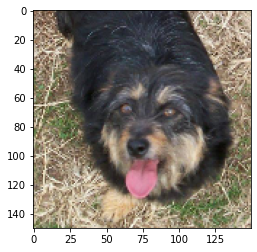

1/1 [==============================] - 0s 36ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 51


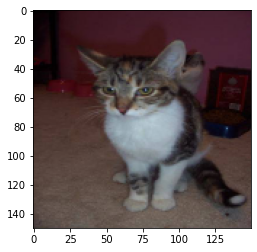

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 84


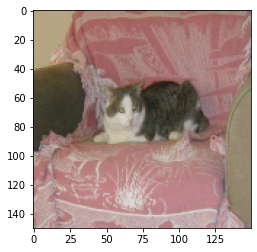

1/1 [==============================] - 0s 32ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 27


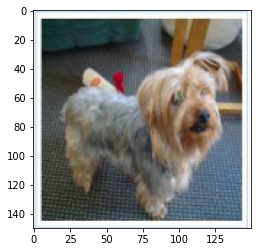

1/1 [==============================] - 0s 42ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 10


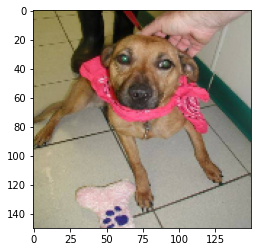

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 71


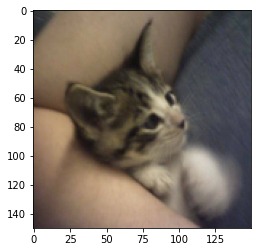

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 69


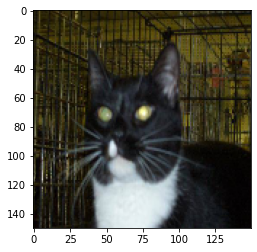

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 21


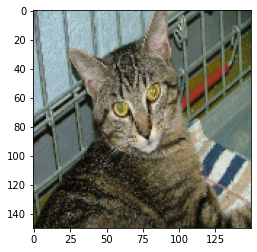

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 13


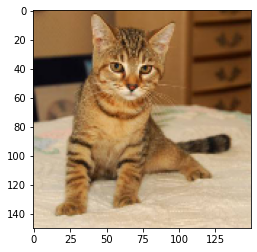

1/1 [==============================] - 0s 29ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 33


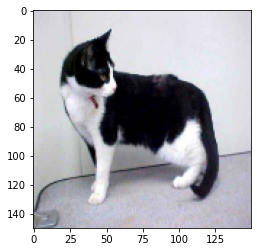

1/1 [==============================] - 0s 36ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 68


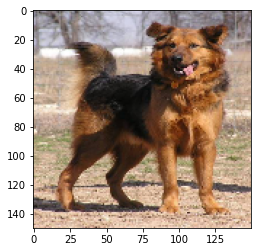

1/1 [==============================] - 0s 43ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 38


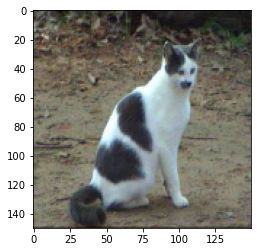

1/1 [==============================] - 0s 37ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 1


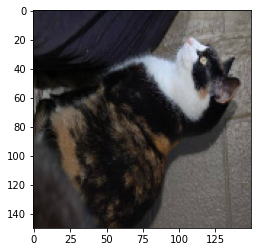

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 66


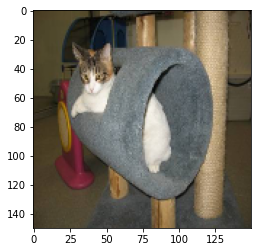

1/1 [==============================] - 0s 31ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 41


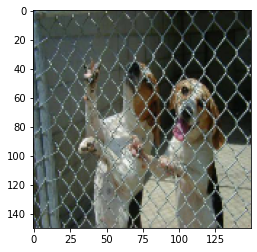

1/1 [==============================] - 0s 41ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 85


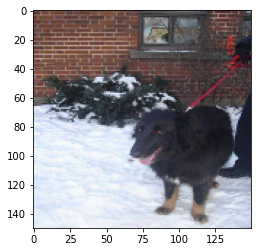

1/1 [==============================] - 0s 40ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 98


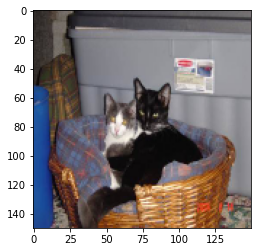

1/1 [==============================] - 0s 41ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 31


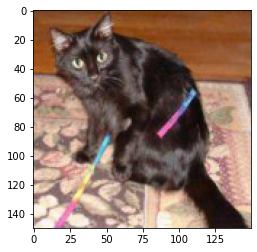

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 97


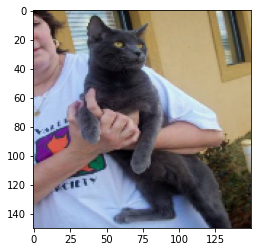

1/1 [==============================] - 0s 41ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 70


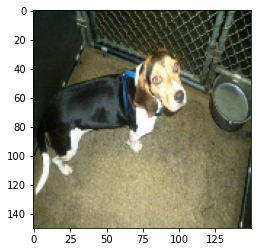

1/1 [==============================] - 0s 39ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 83


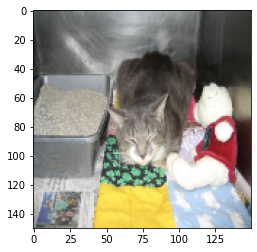

1/1 [==============================] - 0s 33ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 96


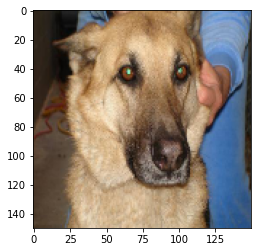

1/1 [==============================] - 0s 38ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 49


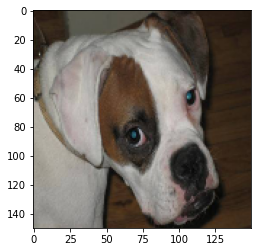

1/1 [==============================] - 0s 42ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 61


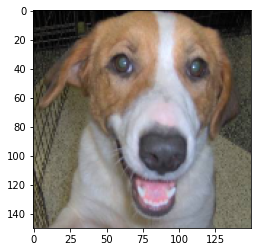

1/1 [==============================] - 0s 34ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 46


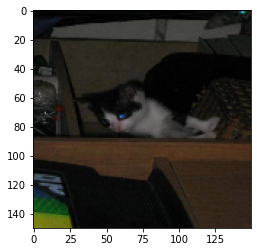

1/1 [==============================] - 0s 34ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 50


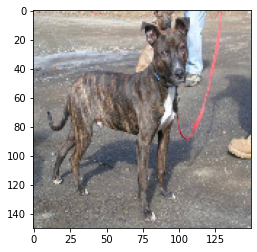

1/1 [==============================] - 0s 32ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 58


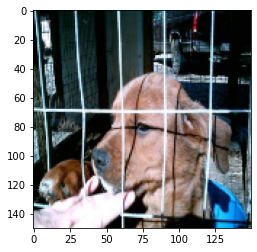

1/1 [==============================] - 0s 34ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 73


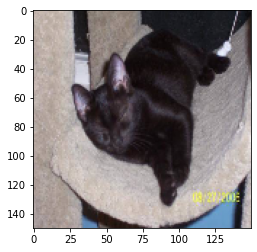

1/1 [==============================] - 0s 43ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 76


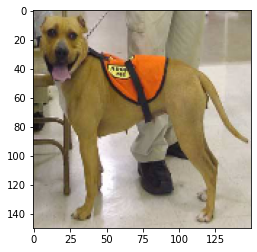

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 74


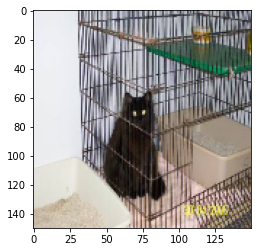

1/1 [==============================] - 0s 43ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 54


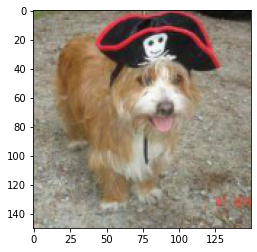

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 3


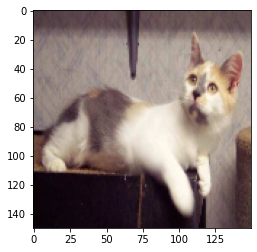

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 90


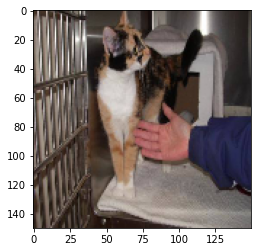

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 53


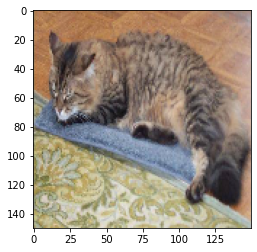

1/1 [==============================] - 0s 45ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 55


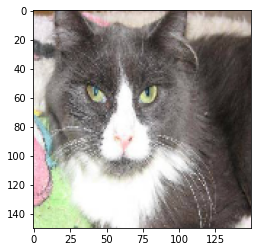

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 강아지  결과 : 틀림  인덱스 : 24


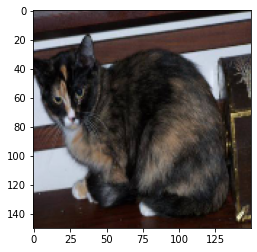

1/1 [==============================] - 0s 32ms/step
예측값 : ['강아지']  실제값 : 강아지  결과 : 맞음  인덱스 : 91


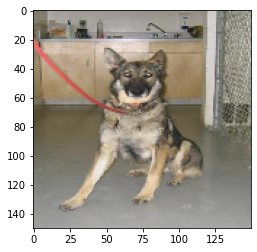

In [54]:
for ind in inds:
    plt.imshow(X_train[ind].astype(np.int))
    pred = model.predict(X_train[[ind]])
    pred = np.where(pred>0.5,'강아지','고양이')[0]
    real = np.where(y_train >0.5,'강아지','고양이')[0]
    if pred == real:
        result = '맞음'
    else:
        result = '틀림'
    print("예측값 :",pred, " 실제값 :", real, " 결과 :",result, " 인덱스 :", ind )
    plt.show()

In [1]:
from keras.datasets import cifar10

In [2]:
from keras.applications import VGG19

In [4]:
base1_model = VGG19(include_top=False,
                    input_shape=(32,32,3))
base1_model.summary()

80134624/80134624 [==============================] - 2s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                              

In [ ]:
model = Sequential([
    Flatten(),
    Dense(512,activation='relu'),
    Dense(10,activation='softmax'),
    
])

In [ ]:
X_train_conv = base1_model